# **1. Introduction**

Generative Adversarial Networks (GANs) have emerged as a powerful deep learning technique for generating realistic images. Among the many variations of GANs, Deep Convolutional GANs (DCGANs) have been particularly successful in generating high-quality synthetic images.

In this work, we implement a DCGAN to generate anime-style face images at a resolution of 64×64 pixels.
Our implementation follows the standard DCGAN architecture, which consists of a generator and a discriminator network competing in a minimax game.
The generator learns to produce realistic anime faces, while the discriminator learns to distinguish real images from synthetic ones. By training on a dataset of anime faces, the model progressively refines its ability to generate visually convincing images.

This notebook outlines the process of data preprocessing, network architecture design, training setup, and results evaluation.

# **2. Installing Required Libraries**
Before running this notebook, we have to ensure that all the required dependencies are installed. The necessary libraries include PyTorch, Torchvision, Matplotlib, and Kaggle API for dataset retrieval. The following cell installs any missing libraries.

In [1]:
!pip install torch torchvision numpy matplotlib

# **3. Importing Required Libraries**
Here, we import essential libraries for building and training the DCGAN model, handling datasets,
and visualizing results.

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import torchvision.datasets as dset
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import os
import numpy as np

# **4. Loading and Preprocessing the Dataset**

## **4.1. Downloading the Dataset**
To train the DCGAN model, we use an anime face dataset available on Kaggle. The dataset consists of thousands of high-quality anime face images, which serve as the training data for our generative model. The dataset can be accessed at: https://www.kaggle.com/datasets/splcher/animefacedataset

In [3]:
!kaggle datasets download -d splcher/animefacedataset
!unzip animefacedataset.zip -d anime_faces/

Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
 93%|██████████████████████████████████████   | 366M/395M [00:01<00:00, 314MB/s]
100%|█████████████████████████████████████████| 395M/395M [00:01<00:00, 323MB/s]
Archive:  animefacedataset.zip
  inflating: anime_faces/images/0_2000.jpg  
  inflating: anime_faces/images/10000_2004.jpg  
  inflating: anime_faces/images/10001_2004.jpg  
  inflating: anime_faces/images/10002_2004.jpg  
  inflating: anime_faces/images/10003_2004.jpg  
  inflating: anime_faces/images/10004_2004.jpg  
  inflating: anime_faces/images/10005_2004.jpg  
  inflating: anime_faces/images/10006_2004.jpg  
  inflating: anime_faces/images/10007_2004.jpg  
  inflating: anime_faces/images/10008_2004.jpg  
  inflating: anime_faces/images/10009_2004.jpg  
  inflating: anime_faces/images/1000_2000.jpg  
  inflating: anime_faces/images/10010_2004.jpg  
  inflating: anime_faces/images/10011_2004.jpg  
  inflating: anime_faces/images/100

## **4.2. Hyperparameters for DCGAN Training**
The following hyperparameters are used for training the DCGAN model to generate anime face images:

In [4]:
# Hyperparameters
config = {
    "image_size": 64,
    "batch_size": 128,
    "nz": 100,  # Latent vector size
    "num_epochs": 200,
    "lr": 0.0002,
    "beta1": 0.5,  # Adam optimizer beta1
    "device": torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    "nrow": 6  # Number of images per row (6x4 = 24 images per grid)
}

## **4.3. Applying Transformations and Creating a DataLoader**
Before feeding the images into the model, we define a transformation pipeline for our dataset. We resize and crop the images to 64x64, convert them to tensors, and normalize them to the range [-1,1]. We then load the dataset from the "anime_faces/" directory using ImageFolder, applying our transformations. Finally, we create a dataloader with a batch size of 128 and enable shuffling for better training dynamics.

In [5]:
# DataLoader
dataset = dset.ImageFolder(root="anime_faces/", transform=transforms.Compose([
    transforms.Resize(config["image_size"]),
    transforms.CenterCrop(config["image_size"]),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=config["batch_size"], shuffle=True)

## **4.4. Viewing a Sample from the Dataset**
We first visualize a batch of sample images from our dataset. We first retrieve a batch from the dataloader and denormalize the images to bring them back to a [0,1] range. Then, we use matplotlib and torchvision.utils.make_grid to display a grid of 24 images, giving us a quick look at how our dataset appears before training.

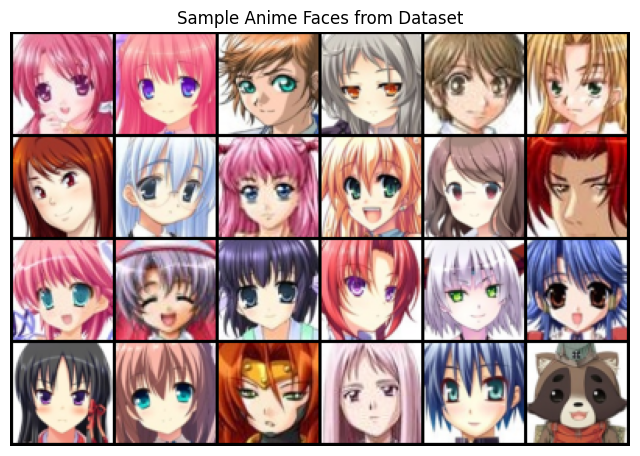

In [6]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Get a batch of images from the DataLoader
dataiter = iter(dataloader)
images, _ = next(dataiter)

# Denormalize the images (since they were normalized to [-1,1])
def denormalize(img):
    return img * 0.5 + 0.5  # Convert back to range [0,1]

# Display the images
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Sample Anime Faces from Dataset")
plt.imshow(vutils.make_grid(denormalize(images[:24]), nrow=6).permute(1, 2, 0))  # Show first 16 images
plt.show()

# **5. Defining the DCGAN Model**
The Deep Convolutional Generative Adversarial Network (DCGAN) consists of a Generator and a Discriminator. The Generator creates synthetic images, while the Discriminator classifies images as real or fake.

## **5.1. Generator**
The Generator is a neural network that takes random noise as input and generates an image. It uses transposed convolutional layers and batch normalization to upsample the input into a realistic image.
Here, we define the generator network for our DCGAN. It takes a random noise vector as input and progressively upsamples it using transposed convolution layers, batch normalization, and ReLU activations to generate 64x64 images. The final layer uses a Tanh activation to output images in the range [-1,1].

In [7]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

## **5.2. Discriminator**
The Discriminator is a convolutional neural network that distinguishes between real and fake images.
It outputs a probability indicating how likely an image is real.
Here, we define the discriminator network for our DCGAN. It takes a 64x64 image as input and progressively downsamples it using convolutional layers with spectral normalization for stability. Leaky ReLU activations are used to improve gradient flow. The final layer outputs a single value between 0 and 1, representing whether the image is real or fake.

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# **6. Initalizing Models & Setting up Training**
In this step, we set up the training environment for our DCGAN. We check for GPU availability and move the generator and discriminator to the appropriate device. Binary Cross Entropy Loss is used as the loss function. We initialize Adam optimizers with learning rate = 0.0002 for the generator and discriminator. A fixed noise vector is also created to generate consistent images for evaluation during training.

In [9]:
# Initialize models, loss, and optimizers
netG = Generator(config["nz"]).to(config["device"])
netD = Discriminator().to(config["device"])
criterion = nn.BCELoss()
optimizerG = optim.Adam(netG.parameters(), lr=config["lr"], betas=(config["beta1"], 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=config["lr"], betas=(config["beta1"], 0.999))

# Fixed noise for visualization
fixed_noise = torch.randn(24, config["nz"], 1, 1, device=config["device"])

# **7. Training the DCGAN**
We now implement the training loop for our DCGAN by alternating between training generator and discriminator. We train the discriminator by optimizing its ability to distinguish real and fake images. The generator is trained by trying to fool the discriminator into classifying generated images as real. Losses for both networks are recorded for analysis. Every 100 steps, we print the current losses, and at the end of each epoch, we save a set of generated images for progress tracking.

Epoch [1/200], Step [0/497], D Loss: 1.4584, G Loss: 2.7308
Epoch [1/200], Step [100/497], D Loss: 0.5937, G Loss: 4.7119
Epoch [1/200], Step [200/497], D Loss: 0.7884, G Loss: 5.7605
Epoch [1/200], Step [300/497], D Loss: 0.9568, G Loss: 5.3276
Epoch [1/200], Step [400/497], D Loss: 1.1999, G Loss: 8.6506


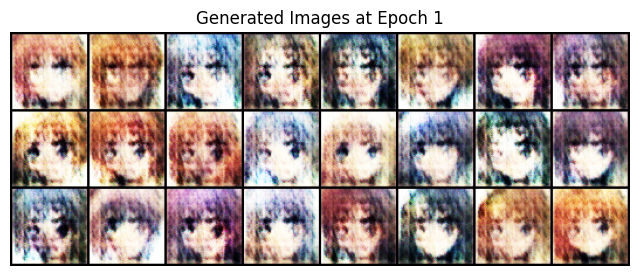

Epoch [2/200], Step [0/497], D Loss: 0.8678, G Loss: 5.8187
Epoch [2/200], Step [100/497], D Loss: 0.6269, G Loss: 4.4734
Epoch [2/200], Step [200/497], D Loss: 0.6663, G Loss: 5.5250
Epoch [2/200], Step [300/497], D Loss: 0.7625, G Loss: 5.6611
Epoch [2/200], Step [400/497], D Loss: 0.7674, G Loss: 5.4951
Epoch [3/200], Step [0/497], D Loss: 0.5420, G Loss: 6.2066
Epoch [3/200], Step [100/497], D Loss: 0.6835, G Loss: 6.0905
Epoch [3/200], Step [200/497], D Loss: 1.2763, G Loss: 3.0303
Epoch [3/200], Step [300/497], D Loss: 0.4886, G Loss: 4.5261
Epoch [3/200], Step [400/497], D Loss: 0.4806, G Loss: 4.5819
Epoch [4/200], Step [0/497], D Loss: 0.8741, G Loss: 8.9635
Epoch [4/200], Step [100/497], D Loss: 0.4845, G Loss: 5.5988
Epoch [4/200], Step [200/497], D Loss: 0.4992, G Loss: 4.7932
Epoch [4/200], Step [300/497], D Loss: 0.5177, G Loss: 3.7839
Epoch [4/200], Step [400/497], D Loss: 0.4795, G Loss: 4.4359
Epoch [5/200], Step [0/497], D Loss: 0.5609, G Loss: 6.6950
Epoch [5/200], S

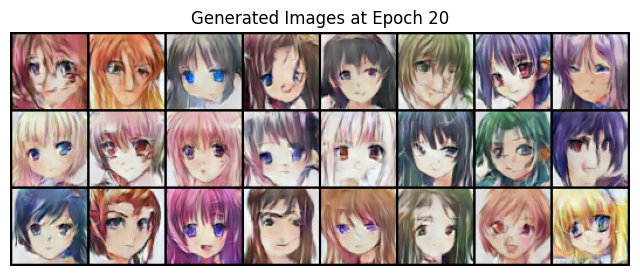

Epoch [21/200], Step [0/497], D Loss: 0.4149, G Loss: 3.3289
Epoch [21/200], Step [100/497], D Loss: 0.5971, G Loss: 2.3769
Epoch [21/200], Step [200/497], D Loss: 0.4095, G Loss: 4.0041
Epoch [21/200], Step [300/497], D Loss: 1.8902, G Loss: 2.0505
Epoch [21/200], Step [400/497], D Loss: 0.4807, G Loss: 2.7868
Epoch [22/200], Step [0/497], D Loss: 0.4737, G Loss: 3.1858
Epoch [22/200], Step [100/497], D Loss: 0.4743, G Loss: 4.3104
Epoch [22/200], Step [200/497], D Loss: 0.4403, G Loss: 4.3537
Epoch [22/200], Step [300/497], D Loss: 0.5037, G Loss: 2.7733
Epoch [22/200], Step [400/497], D Loss: 2.9741, G Loss: 0.5578
Epoch [23/200], Step [0/497], D Loss: 0.4191, G Loss: 4.7614
Epoch [23/200], Step [100/497], D Loss: 0.5252, G Loss: 4.7153
Epoch [23/200], Step [200/497], D Loss: 0.4193, G Loss: 4.3281
Epoch [23/200], Step [300/497], D Loss: 0.8494, G Loss: 6.2516
Epoch [23/200], Step [400/497], D Loss: 0.4874, G Loss: 4.3217
Epoch [24/200], Step [0/497], D Loss: 0.4355, G Loss: 3.1916


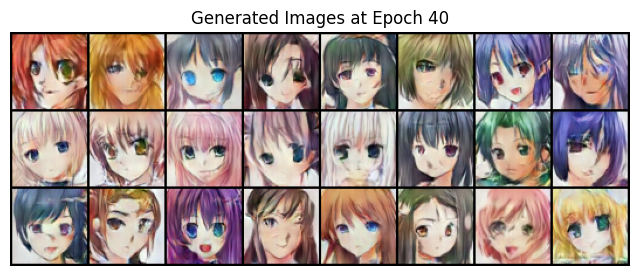

Epoch [41/200], Step [0/497], D Loss: 0.5215, G Loss: 3.0169
Epoch [41/200], Step [100/497], D Loss: 0.3750, G Loss: 4.3743
Epoch [41/200], Step [200/497], D Loss: 0.4946, G Loss: 2.7129
Epoch [41/200], Step [300/497], D Loss: 0.4162, G Loss: 3.2552
Epoch [41/200], Step [400/497], D Loss: 0.3696, G Loss: 5.8017
Epoch [42/200], Step [0/497], D Loss: 1.1891, G Loss: 5.6189
Epoch [42/200], Step [100/497], D Loss: 0.4067, G Loss: 3.7502
Epoch [42/200], Step [200/497], D Loss: 0.3650, G Loss: 4.4671
Epoch [42/200], Step [300/497], D Loss: 0.3594, G Loss: 4.3547
Epoch [42/200], Step [400/497], D Loss: 0.4893, G Loss: 2.2728
Epoch [43/200], Step [0/497], D Loss: 0.3990, G Loss: 4.6192
Epoch [43/200], Step [100/497], D Loss: 0.3884, G Loss: 4.2126
Epoch [43/200], Step [200/497], D Loss: 0.3629, G Loss: 5.0697
Epoch [43/200], Step [300/497], D Loss: 0.4543, G Loss: 5.1120
Epoch [43/200], Step [400/497], D Loss: 0.3614, G Loss: 5.1588
Epoch [44/200], Step [0/497], D Loss: 0.3727, G Loss: 4.5032


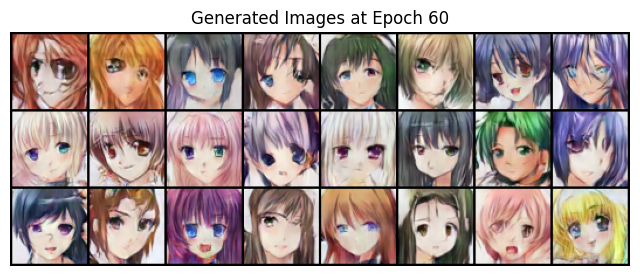

Epoch [61/200], Step [0/497], D Loss: 0.3536, G Loss: 5.3723
Epoch [61/200], Step [100/497], D Loss: 0.3709, G Loss: 4.0737
Epoch [61/200], Step [200/497], D Loss: 0.3561, G Loss: 4.8961
Epoch [61/200], Step [300/497], D Loss: 0.3517, G Loss: 5.1563
Epoch [61/200], Step [400/497], D Loss: 0.4146, G Loss: 3.5742
Epoch [62/200], Step [0/497], D Loss: 0.5871, G Loss: 5.6070
Epoch [62/200], Step [100/497], D Loss: 0.3595, G Loss: 5.6912
Epoch [62/200], Step [200/497], D Loss: 0.3903, G Loss: 5.0543
Epoch [62/200], Step [300/497], D Loss: 0.3755, G Loss: 4.2660
Epoch [62/200], Step [400/497], D Loss: 0.3795, G Loss: 4.0161
Epoch [63/200], Step [0/497], D Loss: 0.3579, G Loss: 5.2382
Epoch [63/200], Step [100/497], D Loss: 0.4426, G Loss: 2.9284
Epoch [63/200], Step [200/497], D Loss: 0.4017, G Loss: 5.5847
Epoch [63/200], Step [300/497], D Loss: 0.3509, G Loss: 5.7567
Epoch [63/200], Step [400/497], D Loss: 0.3580, G Loss: 5.1707
Epoch [64/200], Step [0/497], D Loss: 0.3683, G Loss: 4.7089


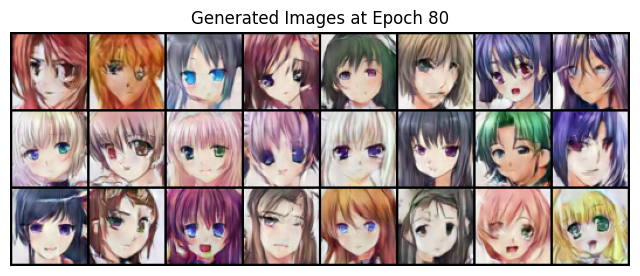

Epoch [81/200], Step [0/497], D Loss: 0.3485, G Loss: 6.1623
Epoch [81/200], Step [100/497], D Loss: 0.3510, G Loss: 5.2336
Epoch [81/200], Step [200/497], D Loss: 0.3457, G Loss: 6.1320
Epoch [81/200], Step [300/497], D Loss: 0.4871, G Loss: 5.5269
Epoch [81/200], Step [400/497], D Loss: 0.4334, G Loss: 4.9022
Epoch [82/200], Step [0/497], D Loss: 0.3522, G Loss: 5.1139
Epoch [82/200], Step [100/497], D Loss: 0.3431, G Loss: 6.3105
Epoch [82/200], Step [200/497], D Loss: 0.6432, G Loss: 6.5467
Epoch [82/200], Step [300/497], D Loss: 0.4686, G Loss: 2.4703
Epoch [82/200], Step [400/497], D Loss: 0.4410, G Loss: 3.2404
Epoch [83/200], Step [0/497], D Loss: 0.4311, G Loss: 5.1691
Epoch [83/200], Step [100/497], D Loss: 0.5114, G Loss: 5.2590
Epoch [83/200], Step [200/497], D Loss: 0.3691, G Loss: 4.5046
Epoch [83/200], Step [300/497], D Loss: 0.3662, G Loss: 4.6460
Epoch [83/200], Step [400/497], D Loss: 0.3703, G Loss: 5.2044
Epoch [84/200], Step [0/497], D Loss: 0.3549, G Loss: 5.5317


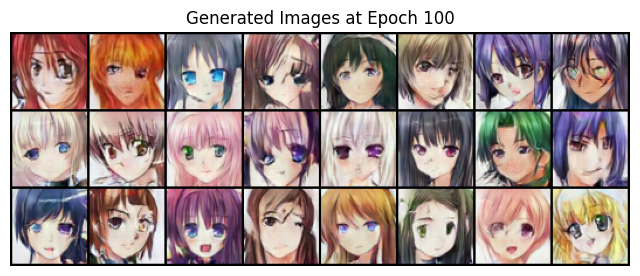

Epoch [101/200], Step [0/497], D Loss: 0.3882, G Loss: 4.6619
Epoch [101/200], Step [100/497], D Loss: 0.3631, G Loss: 4.8478
Epoch [101/200], Step [200/497], D Loss: 0.6994, G Loss: 5.8950
Epoch [101/200], Step [300/497], D Loss: 0.4532, G Loss: 3.1427
Epoch [101/200], Step [400/497], D Loss: 0.4724, G Loss: 4.7441
Epoch [102/200], Step [0/497], D Loss: 0.3690, G Loss: 4.8448
Epoch [102/200], Step [100/497], D Loss: 0.3565, G Loss: 4.9713
Epoch [102/200], Step [200/497], D Loss: 0.3621, G Loss: 4.6127
Epoch [102/200], Step [300/497], D Loss: 0.3667, G Loss: 3.8441
Epoch [102/200], Step [400/497], D Loss: 0.3489, G Loss: 5.4809
Epoch [103/200], Step [0/497], D Loss: 0.4405, G Loss: 2.9564
Epoch [103/200], Step [100/497], D Loss: 0.3538, G Loss: 5.2461
Epoch [103/200], Step [200/497], D Loss: 0.3957, G Loss: 5.7148
Epoch [103/200], Step [300/497], D Loss: 0.3521, G Loss: 5.3499
Epoch [103/200], Step [400/497], D Loss: 0.3832, G Loss: 3.9377
Epoch [104/200], Step [0/497], D Loss: 0.4035,

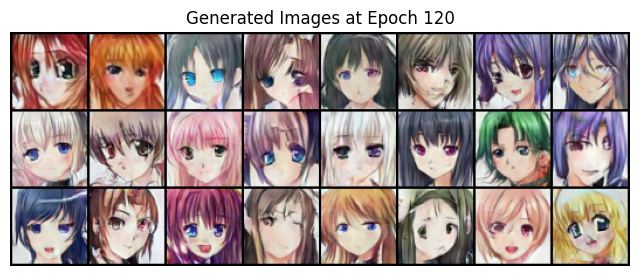

Epoch [121/200], Step [0/497], D Loss: 0.3761, G Loss: 4.8454
Epoch [121/200], Step [100/497], D Loss: 0.3472, G Loss: 6.0959
Epoch [121/200], Step [200/497], D Loss: 0.3434, G Loss: 6.1518
Epoch [121/200], Step [300/497], D Loss: 0.3466, G Loss: 5.3382
Epoch [121/200], Step [400/497], D Loss: 1.1240, G Loss: 1.7911
Epoch [122/200], Step [0/497], D Loss: 0.3805, G Loss: 4.1685
Epoch [122/200], Step [100/497], D Loss: 0.3586, G Loss: 5.0263
Epoch [122/200], Step [200/497], D Loss: 0.3557, G Loss: 5.7770
Epoch [122/200], Step [300/497], D Loss: 0.3579, G Loss: 4.3323
Epoch [122/200], Step [400/497], D Loss: 0.3460, G Loss: 5.4341
Epoch [123/200], Step [0/497], D Loss: 0.3504, G Loss: 6.2767
Epoch [123/200], Step [100/497], D Loss: 0.3801, G Loss: 4.9865
Epoch [123/200], Step [200/497], D Loss: 0.3411, G Loss: 6.1871
Epoch [123/200], Step [300/497], D Loss: 0.3525, G Loss: 5.8169
Epoch [123/200], Step [400/497], D Loss: 0.3562, G Loss: 5.8554
Epoch [124/200], Step [0/497], D Loss: 0.3660,

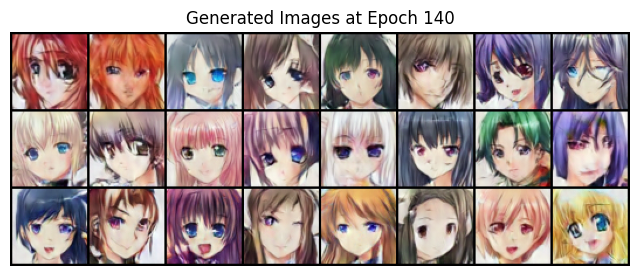

Epoch [141/200], Step [0/497], D Loss: 0.3731, G Loss: 5.8222
Epoch [141/200], Step [100/497], D Loss: 0.3679, G Loss: 5.4052
Epoch [141/200], Step [200/497], D Loss: 0.3873, G Loss: 5.1904
Epoch [141/200], Step [300/497], D Loss: 0.3698, G Loss: 4.8060
Epoch [141/200], Step [400/497], D Loss: 0.3539, G Loss: 5.3205
Epoch [142/200], Step [0/497], D Loss: 0.3583, G Loss: 6.2957
Epoch [142/200], Step [100/497], D Loss: 0.3746, G Loss: 4.3970
Epoch [142/200], Step [200/497], D Loss: 0.3468, G Loss: 5.6475
Epoch [142/200], Step [300/497], D Loss: 0.3526, G Loss: 5.4727
Epoch [142/200], Step [400/497], D Loss: 0.4196, G Loss: 4.8217
Epoch [143/200], Step [0/497], D Loss: 0.3823, G Loss: 3.8822
Epoch [143/200], Step [100/497], D Loss: 0.3553, G Loss: 5.4520
Epoch [143/200], Step [200/497], D Loss: 0.3677, G Loss: 4.3918
Epoch [143/200], Step [300/497], D Loss: 0.3487, G Loss: 4.7212
Epoch [143/200], Step [400/497], D Loss: 0.3851, G Loss: 5.1451
Epoch [144/200], Step [0/497], D Loss: 0.3535,

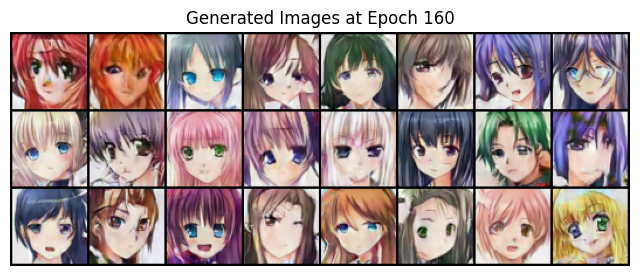

Epoch [161/200], Step [0/497], D Loss: 0.3614, G Loss: 5.4246
Epoch [161/200], Step [100/497], D Loss: 0.3737, G Loss: 4.5941
Epoch [161/200], Step [200/497], D Loss: 0.4117, G Loss: 5.4325
Epoch [161/200], Step [300/497], D Loss: 0.4169, G Loss: 4.6218
Epoch [161/200], Step [400/497], D Loss: 0.3786, G Loss: 4.4230
Epoch [162/200], Step [0/497], D Loss: 0.3955, G Loss: 4.5376
Epoch [162/200], Step [100/497], D Loss: 0.3584, G Loss: 5.0067
Epoch [162/200], Step [200/497], D Loss: 0.3621, G Loss: 6.4761
Epoch [162/200], Step [300/497], D Loss: 0.3465, G Loss: 5.7837
Epoch [162/200], Step [400/497], D Loss: 0.3515, G Loss: 5.6953
Epoch [163/200], Step [0/497], D Loss: 0.3514, G Loss: 4.8148
Epoch [163/200], Step [100/497], D Loss: 0.3585, G Loss: 6.4709
Epoch [163/200], Step [200/497], D Loss: 0.3752, G Loss: 5.4784
Epoch [163/200], Step [300/497], D Loss: 0.3641, G Loss: 5.1691
Epoch [163/200], Step [400/497], D Loss: 0.4087, G Loss: 5.7066
Epoch [164/200], Step [0/497], D Loss: 0.3947,

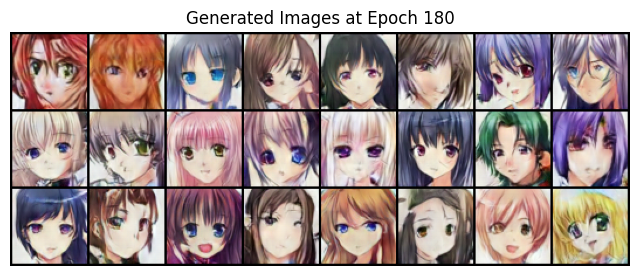

Epoch [181/200], Step [0/497], D Loss: 0.3491, G Loss: 6.3925
Epoch [181/200], Step [100/497], D Loss: 0.3528, G Loss: 4.8993
Epoch [181/200], Step [200/497], D Loss: 0.3449, G Loss: 5.4591
Epoch [181/200], Step [300/497], D Loss: 0.3426, G Loss: 5.1945
Epoch [181/200], Step [400/497], D Loss: 0.3655, G Loss: 5.0115
Epoch [182/200], Step [0/497], D Loss: 0.3397, G Loss: 5.4037
Epoch [182/200], Step [100/497], D Loss: 0.3512, G Loss: 5.7070
Epoch [182/200], Step [200/497], D Loss: 0.3682, G Loss: 4.7531
Epoch [182/200], Step [300/497], D Loss: 0.3698, G Loss: 4.6053
Epoch [182/200], Step [400/497], D Loss: 0.3549, G Loss: 5.3408
Epoch [183/200], Step [0/497], D Loss: 0.3502, G Loss: 6.7678
Epoch [183/200], Step [100/497], D Loss: 0.3464, G Loss: 6.8534
Epoch [183/200], Step [200/497], D Loss: 0.3738, G Loss: 4.6266
Epoch [183/200], Step [300/497], D Loss: 0.3999, G Loss: 5.0218
Epoch [183/200], Step [400/497], D Loss: 0.6694, G Loss: 6.1019
Epoch [184/200], Step [0/497], D Loss: 0.4163,

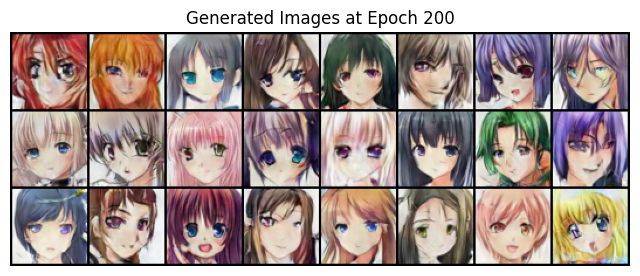

In [10]:
# Training Loop
G_losses, D_losses = [], []
num_epochs = config["num_epochs"]
generated_images = {}

def train_dcgan():
    """Train the DCGAN model and save generated images every 10 epochs."""
    for epoch in range(num_epochs):
        for i, (real_images, _) in enumerate(dataloader):
            real_images = real_images.to(config["device"])
            batch_size = real_images.size(0)

            # Label smoothing
            real_labels = torch.full((batch_size,), 0.9, device=config["device"])  # Real labels slightly lower than 1
            fake_labels = torch.zeros(batch_size, device=config["device"])  # Fake labels as 0

            # Train Discriminator
            netD.zero_grad()
            output_real = netD(real_images).view(-1)
            loss_real = criterion(output_real, real_labels)
            loss_real.backward()

            noise = torch.randn(batch_size, config["nz"], 1, 1, device=config["device"])
            fake_images = netG(noise)
            output_fake = netD(fake_images.detach()).view(-1)
            loss_fake = criterion(output_fake, fake_labels)
            loss_fake.backward()
            optimizerD.step()

            # Train Generator
            netG.zero_grad()
            fake_labels.fill_(1)  # Flip fake labels to real (1)
            output = netD(fake_images).view(-1)
            loss_gen = criterion(output, fake_labels)
            loss_gen.backward()
            optimizerG.step()

            # Store losses
            D_losses.append((loss_real.item() + loss_fake.item()))
            G_losses.append(loss_gen.item())

            if i % 100 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i}/{len(dataloader)}], D Loss: {D_losses[-1]:.4f}, G Loss: {G_losses[-1]:.4f}")

        # Store generated images at the first epoch and every 20th epoch
        if epoch == 0 or ((epoch + 1) % 20 == 0):
            with torch.no_grad():
                fake_images = netG(fixed_noise).detach().cpu()
                generated_images[epoch + 1] = fake_images
                # Convert tensor images to a grid
                img_grid = vutils.make_grid(fake_images, normalize=True, scale_each=True)
                # Display the generated images
                plt.figure(figsize=(8, 8))
                plt.axis("off")
                plt.title(f"Generated Images at Epoch {epoch + 1}")
                plt.imshow(img_grid.permute(1, 2, 0).numpy())  # Convert to (H, W, C)
                plt.show()

# Run training
train_dcgan()

# **8. Saving the Trained Model**
After training, we save and download the model so it can be used later for generating new anime faces on demand at our web-page browser on Hugging Face Spaces.

In [11]:
# Save the models
torch.save(netG.state_dict(), "/kaggle/working/generator.pth")
torch.save(netD.state_dict(), "/kaggle/working/discriminator.pth")

print("Models saved successfully!")

Models saved successfully!


# **9. Visualizing Results**
Finally, we visualize the training progress of our DCGAN. First, we plot the generator and discriminator losses over iterations to track how well the networks are learning. Then, we load and display selected generated images from specific epochs to observe how the quality of the generated anime faces evolves over time.

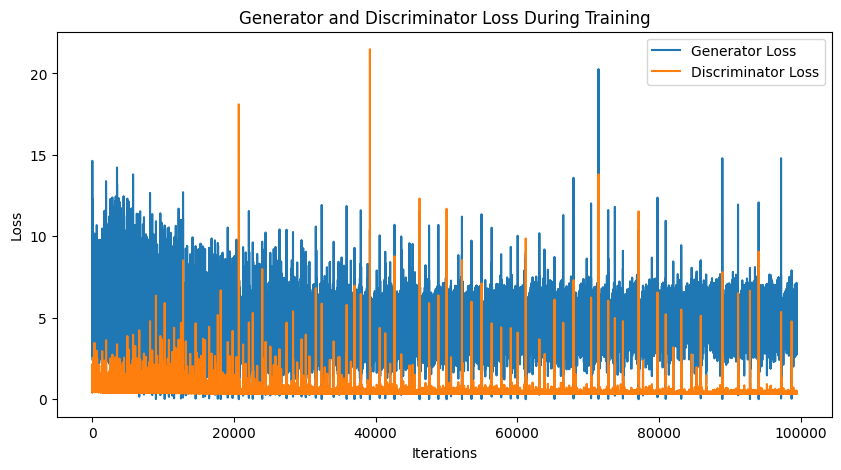

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="Generator Loss")
plt.plot(D_losses, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

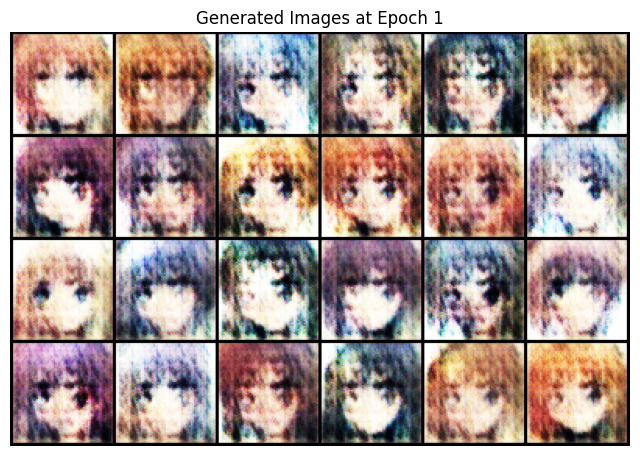

Saved: /kaggle/working/generated_images/epoch_1.png


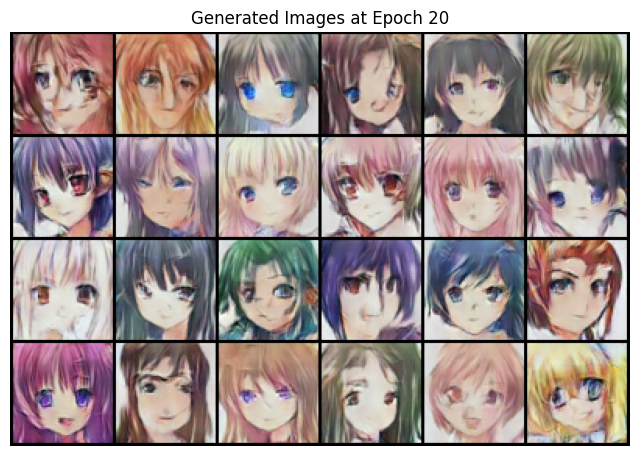

Saved: /kaggle/working/generated_images/epoch_20.png


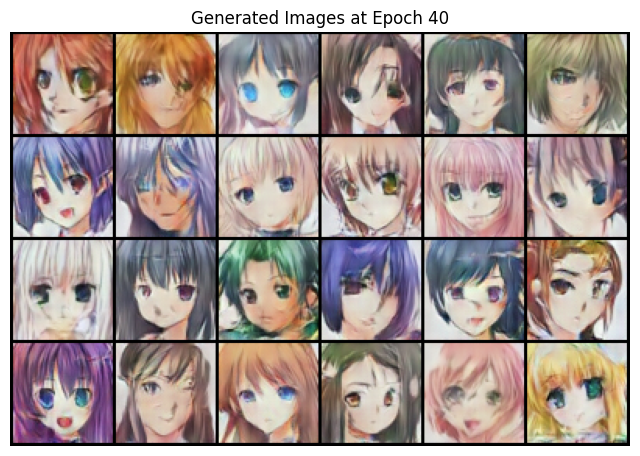

Saved: /kaggle/working/generated_images/epoch_40.png


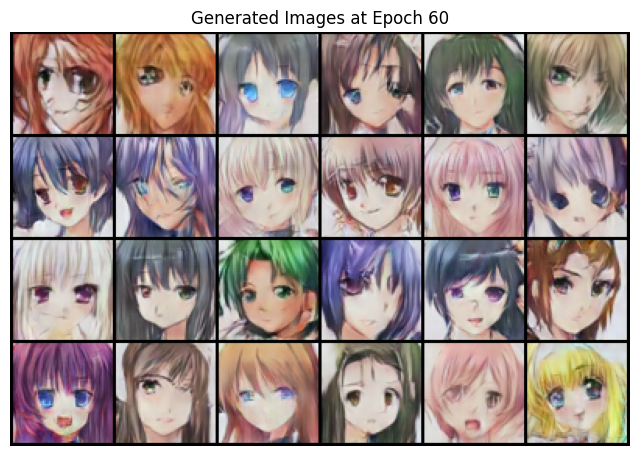

Saved: /kaggle/working/generated_images/epoch_60.png


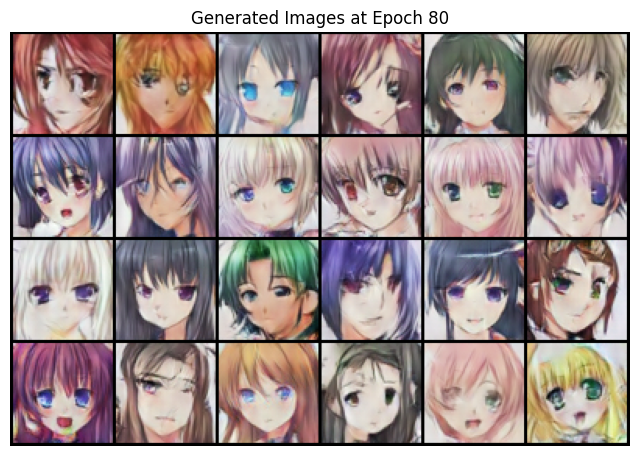

Saved: /kaggle/working/generated_images/epoch_80.png


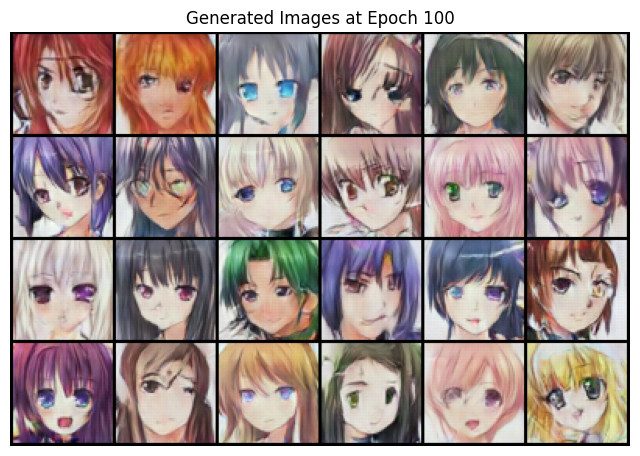

Saved: /kaggle/working/generated_images/epoch_100.png


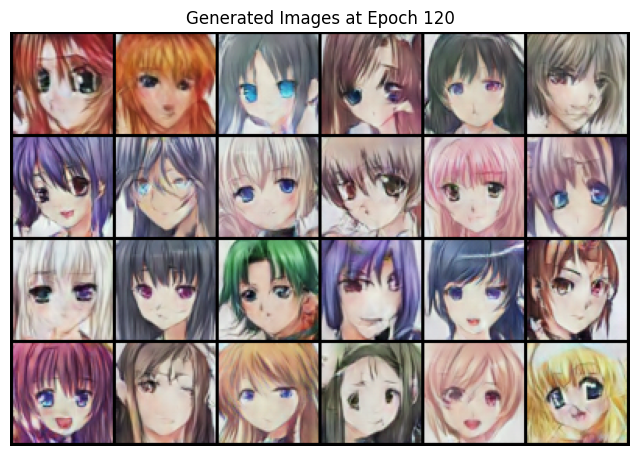

Saved: /kaggle/working/generated_images/epoch_120.png


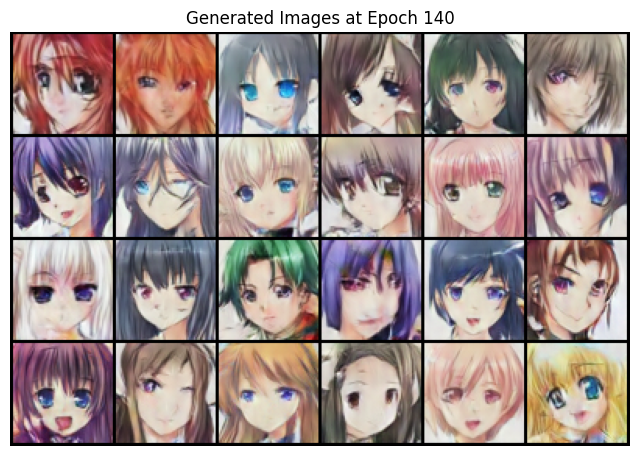

Saved: /kaggle/working/generated_images/epoch_140.png


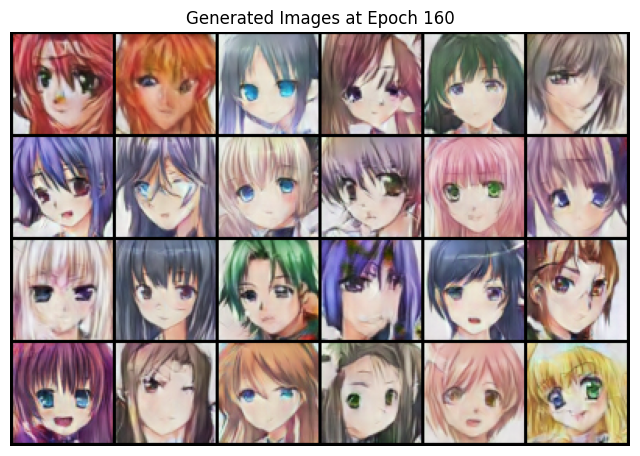

Saved: /kaggle/working/generated_images/epoch_160.png


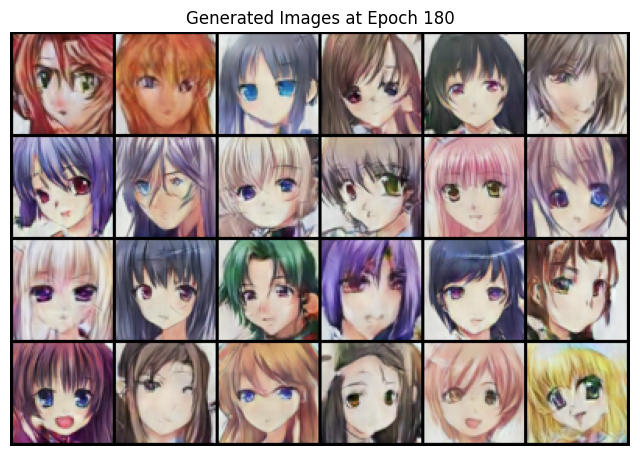

Saved: /kaggle/working/generated_images/epoch_180.png


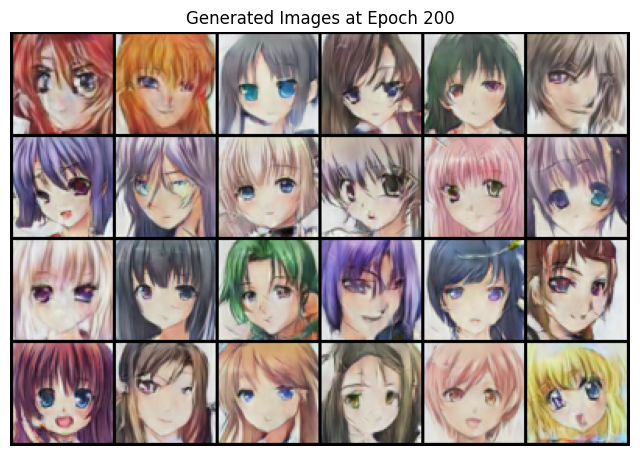

Saved: /kaggle/working/generated_images/epoch_200.png


In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Create a directory to store images
save_dir = "/kaggle/working/generated_images"
os.makedirs(save_dir, exist_ok=True)

# Display and save stored generated images every 20 epochs
for epoch, img in generated_images.items():
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Generated Images at Epoch {epoch}")
    
    # Convert image to numpy format for saving
    img_grid = np.transpose(vutils.make_grid(img, nrow=config["nrow"], normalize=True).cpu(), (1, 2, 0))
    plt.imshow(img_grid)
    
    # Save the image
    save_path = f"{save_dir}/epoch_{epoch}.png"
    plt.savefig(save_path)

    # Show the image
    plt.show()

    # Close the plot to avoid excessive memory usage
    plt.close()

    print(f"Saved: {save_path}")